# Churn Prediction

In this notebook, I will use 2 approaches to perform customer churn prediction: survival analysis and supervised classification models.

In [106]:
# import the packages
import numpy as np
import pandas as pd
from datetime import datetime, timedelta, date
from matplotlib import pyplot as plt
import seaborn as sns

import chart_studio.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go
import plotly.express as px
pyoff.init_notebook_mode()

from imblearn.pipeline import Pipeline 
from imblearn.over_sampling import ADASYN

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier

from sklearn.metrics import roc_auc_score, f1_score, precision_score, recall_score, accuracy_score, classification_report, precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve

from keras.models import Sequential
from keras.layers import Dense, Activation
from keras import optimizers
from keras import regularizers
from keras.callbacks import EarlyStopping
from keras.callbacks import ReduceLROnPlateau

import lifelines

%matplotlib inline
sns.set()
import warnings
warnings.filterwarnings('ignore')

SEED = 42

In [2]:
# import the data
customer = pd.read_csv('data/olist_customers_dataset.csv')
order = pd.read_csv('data/olist_orders_dataset.csv')
item = pd.read_csv('data/olist_order_items_dataset.csv')
product = pd.read_csv('data/olist_products_dataset.csv')
product_category = pd.read_csv('data/product_category_name_translation.csv')
payment = pd.read_csv('data/olist_order_payments_dataset.csv')
review = pd.read_csv('data/olist_order_reviews_dataset.csv')

In [3]:
# merge the dataset
df = customer.merge(order, how='inner', on='customer_id')
df = df.merge(item, how='inner', on='order_id')
df = df.merge(product, how='inner', on='product_id')
df = df.merge(product_category, how ='left', on='product_category_name')
df = df.merge(payment, how='inner', on='order_id')
df = df.merge(review, how='inner', on='order_id')

df.shape

(118315, 37)

In [4]:
# only keep delivered orders
df = df[df.order_status=='delivered']
df.shape

(115728, 37)

In [5]:
# only keep customers who made more than 1 order
customer_order = df.groupby('customer_unique_id')['order_id'].size()
df = df[df.customer_unique_id.isin(customer_order[customer_order > 1].index)]
df.shape

(36465, 37)

## Feature Engineering

In [6]:
# need to aggregate all features by the customer level
customer_profile = pd.DataFrame(df.customer_unique_id).drop_duplicates()
customer_profile.shape

(14094, 1)

### Target Variable

In [7]:
# convert order_purchase_timestamp to datetime datatype
df['order_datetime'] = pd.to_datetime(df.order_purchase_timestamp)
df.order_datetime.describe()

count                   36465
unique                  16939
top       2017-08-08 20:26:31
freq                       63
first     2016-10-03 09:44:50
last      2018-08-29 14:18:23
Name: order_datetime, dtype: object

In [8]:
# create a dataframe holds each customer's purchase history
purchase_hist = df[['customer_unique_id', 'order_datetime']].sort_values(by=['customer_unique_id', 'order_datetime'])
purchase_hist

,customer_unique_id,order_datetime
13189,00053a61a98854899e70ed204dd4bafe,2018-02-28 11:15:41
13190,00053a61a98854899e70ed204dd4bafe,2018-02-28 11:15:41
40375,000bfa1d2f1a41876493be685390d6d3,2017-09-29 14:46:58
40376,000bfa1d2f1a41876493be685390d6d3,2017-09-29 14:46:58
2792,000de6019bb59f34c099a907c151d855,2017-08-17 19:10:33
...,...,...
102925,fff5eb4918b2bf4b2da476788d42051c,2018-07-02 16:39:59
11151,fff7219c86179ca6441b8f37823ba3d3,2017-12-27 18:57:38
11152,fff7219c86179ca6441b8f37823ba3d3,2017-12-27 18:57:38
114065,fffcf5a5ff07b0908bd4e2dbc735a684,2017-06-08 21:00:36


In [9]:
# create the churn label
# define the customer who didn't buy anything from olist for 2 consecutive months as a churn
# use 2017-09-30 as the cutoff date to separate training and test dataset
train = purchase_hist[purchase_hist.order_datetime <= date(2017, 9, 30)]
train['p1'] = train.groupby('customer_unique_id')['order_datetime'].shift(1)
train['daydiff'] = (train.order_datetime - train.p1).dt.days
train['churn'] = train.daydiff.apply(lambda x: 1 if x > 60 else 0)
churn_id1 = set(train[train.churn == 1].customer_unique_id)

last_purchase = train.groupby('customer_unique_id')['order_datetime'].last()
cutoff = pd.to_datetime(date(2017, 9, 30))
cutoff_daydiff = (cutoff - last_purchase).dt.days
churn = cutoff_daydiff.apply(lambda x: 1 if x > 60 else 0)
churn_id2 = set(churn[churn == 1].index)

churn_id = churn_id1.union(churn_id2)
len(churn_id)

2982

In [10]:
customer_profile['churn'] = customer_profile.customer_unique_id.apply(lambda x: 'Yes' if x in churn_id else 'No')
customer_profile.head()

,customer_unique_id,churn
1,9eae34bbd3a474ec5d07949ca7de67c0,No
9,31318a0597cd9d50ce4cfd03c80fe780,No
11,83aca63b2193ea126b287f3ae61528d9,Yes
19,9e8993ba2665307b71bd1641c2e1cb3d,Yes
24,7dd466ce70871be5aba0ea1a43df6021,No


In [11]:
# visualize churn
plot_data = [go.Histogram(x=customer_profile.churn)]
plot_layout = go.Layout(title='Churn')

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [12]:
# convert to binary
customer_profile.churn = customer_profile.churn.apply(lambda x: 1 if x=='Yes' else 0)
customer_profile.head()

,customer_unique_id,churn
1,9eae34bbd3a474ec5d07949ca7de67c0,0
9,31318a0597cd9d50ce4cfd03c80fe780,0
11,83aca63b2193ea126b287f3ae61528d9,1
19,9e8993ba2665307b71bd1641c2e1cb3d,1
24,7dd466ce70871be5aba0ea1a43df6021,0


### Features

In [13]:
# select features needed for this project
df = df[['customer_unique_id', 'customer_state', 'order_id', 'order_datetime', 
         'order_delivered_customer_date', 'order_estimated_delivery_date', 
         'order_item_id', 'product_id', 'seller_id', 'price', 'freight_value', 
         'product_category_name_english', 'payment_sequential', 'payment_type',
         'payment_installments', 'payment_value', 'review_score']]

df.head()

,customer_unique_id,customer_state,order_id,order_datetime,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,price,freight_value,product_category_name_english,payment_sequential,payment_type,payment_installments,payment_value,review_score
1,9eae34bbd3a474ec5d07949ca7de67c0,PA,c1d2b34febe9cd269e378117d6681172,2017-11-09 00:50:13,2017-11-28 00:09:50,2017-12-19 00:00:00,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,112.99,24.90,office_furniture,1,credit_card,1,275.79,1
2,9eae34bbd3a474ec5d07949ca7de67c0,PA,c1d2b34febe9cd269e378117d6681172,2017-11-09 00:50:13,2017-11-28 00:09:50,2017-12-19 00:00:00,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,112.99,24.90,office_furniture,1,credit_card,1,275.79,1
9,31318a0597cd9d50ce4cfd03c80fe780,MG,1c7fe02ac4c7be50c59afb295cf85b89,2018-01-26 13:22:09,2018-02-20 14:18:51,2018-03-12 00:00:00,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,106.99,21.76,office_furniture,1,boleto,1,257.50,2
10,31318a0597cd9d50ce4cfd03c80fe780,MG,1c7fe02ac4c7be50c59afb295cf85b89,2018-01-26 13:22:09,2018-02-20 14:18:51,2018-03-12 00:00:00,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,106.99,21.76,office_furniture,1,boleto,1,257.50,2
11,83aca63b2193ea126b287f3ae61528d9,SC,5ee63c8c9ae2e5c38791b35932cf4c69,2017-05-09 11:30:18,2017-05-29 08:13:56,2017-06-06 00:00:00,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,124.99,15.62,office_furniture,1,credit_card,6,843.66,4


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36465 entries, 1 to 118314
Data columns (total 17 columns):
customer_unique_id               36465 non-null object
customer_state                   36465 non-null object
order_id                         36465 non-null object
order_datetime                   36465 non-null datetime64[ns]
order_delivered_customer_date    36465 non-null object
order_estimated_delivery_date    36465 non-null object
order_item_id                    36465 non-null int64
product_id                       36465 non-null object
seller_id                        36465 non-null object
price                            36465 non-null float64
freight_value                    36465 non-null float64
product_category_name_english    35944 non-null object
payment_sequential               36465 non-null int64
payment_type                     36465 non-null object
payment_installments             36465 non-null int64
payment_value                    36465 non-null float64
re

In [15]:
# check missing values
def check_missing(df):
    missing = df.isnull().sum()
    missing_percentage = (df.isnull().sum()/len(df)*100).round(2)
    missing_val = pd.concat([missing, missing_percentage], axis = 1)
    missing_val.columns = ['Missing Values', '% Missing']
    total_columns = df.shape[1]
    missing_columns = (df.isnull().sum() > 0).sum()
    print('Out of {} columns, {} columns have missing values'.format(total_columns, missing_columns))
    return missing_val

check_missing(df)

Out of 17 columns, 1 columns have missing values


,Missing Values,% Missing
customer_unique_id,0,0.00
customer_state,0,0.00
order_id,0,0.00
order_datetime,0,0.00
order_delivered_customer_date,0,0.00
order_estimated_delivery_date,0,0.00
order_item_id,0,0.00
product_id,0,0.00
seller_id,0,0.00
price,0,0.00


In [16]:
# fillna
df.product_category_name_english.fillna('Other', inplace=True)

### Customer State

In [17]:
# customer state: most of Olist's customers are from São Paulo
state = pd.DataFrame(df.groupby('customer_unique_id').customer_state.last())

fig = go.Figure()

fig.add_trace(go.Histogram(x=state['customer_state']))

fig.update_layout(
    title_text='Customer State Distribution',
    xaxis_title_text='State',
    yaxis_title_text='Count'
)

fig.show()

In [18]:
# customer churn by state
temp = customer_profile.merge(state, on='customer_unique_id', how='left')

fig = go.Figure()

fig.add_trace(go.Histogram(x=temp.loc[temp.churn==1, 'customer_state'],
                           name='Churn',
                           marker_color='#EB89B5',
                           opacity=0.75))

fig.add_trace(go.Histogram(x=temp.loc[temp.churn==0, 'customer_state'],
                           name='Not Churn',
                           marker_color='#330C73',
                           opacity=0.75))

fig.update_layout(
    title_text='Customer Churn by State',
    xaxis_title_text='State',
    yaxis_title_text='Count',
    bargap=0.2,
    bargroupgap=0.1
)

fig.show()

In [19]:
# aggregate by the customer level
state['other'] = np.where(state.groupby('customer_state').customer_state.transform('size') > 500, state.customer_state, 'Other')
state_dummy = pd.get_dummies(state.other, prefix = 'state').reset_index()
customer_profile = customer_profile.merge(state_dummy, on='customer_unique_id', how='left')
customer_profile

,customer_unique_id,churn,state_MG,state_Other,state_PR,state_RJ,state_RS,state_SC,state_SP
0,9eae34bbd3a474ec5d07949ca7de67c0,0,0,1,0,0,0,0,0
1,31318a0597cd9d50ce4cfd03c80fe780,0,1,0,0,0,0,0,0
2,83aca63b2193ea126b287f3ae61528d9,1,0,0,0,0,0,1,0
3,9e8993ba2665307b71bd1641c2e1cb3d,1,1,0,0,0,0,0,0
4,7dd466ce70871be5aba0ea1a43df6021,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
14089,74ec77145a467b1a96152aac1c3ab137,0,0,0,0,1,0,0,0
14090,514f2a78d07928478ac9212b21b7acbc,1,0,0,0,0,0,0,1
14091,6d443b75cff956bb73dce7385033e266,0,0,0,0,0,0,0,1
14092,40eeaec8ded23f98865c1ebdb041f6ea,0,0,0,0,0,0,0,1


### RFM

In [20]:
# get the latest purchase date
cutoff_date = df.order_datetime.max()

# calculate the latest purchase date for each customer
most_recent_purchase = df.groupby('customer_unique_id').order_datetime.max()

# calculate the days between each customer's most recent purchase and the cutoff date
recency = (cutoff_date - most_recent_purchase).dt.days.reset_index()
recency.columns = ['customer_unique_id', 'recency']
recency

,customer_unique_id,recency
0,00053a61a98854899e70ed204dd4bafe,182
1,000bfa1d2f1a41876493be685390d6d3,333
2,000de6019bb59f34c099a907c151d855,376
3,000e309254ab1fc5ba99dd469d36bdb4,65
4,000fbf0473c10fc1ab6f8d2d286ce20c,34
...,...,...
14089,ffeddf8aa7cdecf403e77b2e9a99e2ea,107
14090,fff22793223fe80c97a8fd02ac5c6295,64
14091,fff5eb4918b2bf4b2da476788d42051c,57
14092,fff7219c86179ca6441b8f37823ba3d3,244


In [21]:
# visualize recency
fig = go.Figure()

fig.add_trace(go.Histogram(x=recency.recency))

fig.update_layout(
    title_text='Recency',
    xaxis_title_text='Number of Days Since Last Purchase'
)

fig.show()

In [22]:
# calculate revenue for each customer
revenue = df.groupby('customer_unique_id').payment_value.sum().reset_index()
revenue.columns = ['customer_unique_id', 'revenue']
revenue

,customer_unique_id,revenue
0,00053a61a98854899e70ed204dd4bafe,838.36
1,000bfa1d2f1a41876493be685390d6d3,93.70
2,000de6019bb59f34c099a907c151d855,514.88
3,000e309254ab1fc5ba99dd469d36bdb4,78.42
4,000fbf0473c10fc1ab6f8d2d286ce20c,1449.52
...,...,...
14089,ffeddf8aa7cdecf403e77b2e9a99e2ea,204.20
14090,fff22793223fe80c97a8fd02ac5c6295,267.57
14091,fff5eb4918b2bf4b2da476788d42051c,17069.76
14092,fff7219c86179ca6441b8f37823ba3d3,531.60


In [23]:
# visualize revenue
fig = go.Figure()

fig.add_trace(go.Histogram(x=revenue.revenue))

fig.update_layout(
    title_text='Revenue',
    xaxis_title_text='Revenue'
)

fig.show()

In [24]:
# count each customers' order numbers
frequency = df.groupby('customer_unique_id').order_id.count().reset_index()
frequency.columns = ['customer_unique_id', 'frequency']
frequency

,customer_unique_id,frequency
0,00053a61a98854899e70ed204dd4bafe,2
1,000bfa1d2f1a41876493be685390d6d3,2
2,000de6019bb59f34c099a907c151d855,2
3,000e309254ab1fc5ba99dd469d36bdb4,2
4,000fbf0473c10fc1ab6f8d2d286ce20c,4
...,...,...
14089,ffeddf8aa7cdecf403e77b2e9a99e2ea,2
14090,fff22793223fe80c97a8fd02ac5c6295,3
14091,fff5eb4918b2bf4b2da476788d42051c,6
14092,fff7219c86179ca6441b8f37823ba3d3,2


In [25]:
# visualize frequency
fig = go.Figure()

fig.add_trace(go.Histogram(x=frequency.frequency))

fig.update_layout(
    title_text='Frequency',
    xaxis_title_text='Frequency'
)

fig.show()

In [26]:
# merge
customer_profile = customer_profile.merge(recency, on='customer_unique_id', how='inner')
customer_profile = customer_profile.merge(revenue, on='customer_unique_id', how='inner')
customer_profile = customer_profile.merge(frequency, on='customer_unique_id', how='inner')
customer_profile

,customer_unique_id,churn,state_MG,state_Other,state_PR,state_RJ,state_RS,state_SC,state_SP,recency,revenue,frequency
0,9eae34bbd3a474ec5d07949ca7de67c0,0,0,1,0,0,0,0,0,293,551.58,2
1,31318a0597cd9d50ce4cfd03c80fe780,0,1,0,0,0,0,0,0,215,515.00,2
2,83aca63b2193ea126b287f3ae61528d9,1,0,0,0,0,0,1,0,477,5061.96,6
3,9e8993ba2665307b71bd1641c2e1cb3d,1,1,0,0,0,0,0,0,565,540.00,2
4,7dd466ce70871be5aba0ea1a43df6021,0,0,1,0,0,0,0,0,154,154.96,2
...,...,...,...,...,...,...,...,...,...,...,...,...
14089,74ec77145a467b1a96152aac1c3ab137,0,0,0,0,1,0,0,0,35,244.00,2
14090,514f2a78d07928478ac9212b21b7acbc,1,0,0,0,0,0,0,1,412,21.81,4
14091,6d443b75cff956bb73dce7385033e266,0,0,0,0,0,0,0,1,358,882.10,12
14092,40eeaec8ded23f98865c1ebdb041f6ea,0,0,0,0,0,0,0,1,202,204.40,2


In [27]:
# customer churn by recency
fig = go.Figure()
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==1, 'recency'], name='Churn'))
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==0, 'recency'], name='Not Churn'))

fig.update_layout(
    title_text='Customer Churn by Recency',
    yaxis_title_text='Number of Days Since Last Purchase'
)

fig.show()

In [28]:
# customer churn by revenue
fig = go.Figure()
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==1, 'revenue'], name='Churn'))
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==0, 'revenue'], name='Not Churn'))

fig.update_layout(
    title_text='Customer Churn by Revenue',
    yaxis_title_text='Revenue'
)

fig.show()

In [29]:
# customer churn by frequency
fig = go.Figure()
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==1, 'frequency'], name='Churn'))
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==0, 'frequency'], name='Not Churn'))

fig.update_layout(
    title_text='Customer Churn by Frequency',
    yaxis_title_text='Number of Orders'
)

fig.show()

### Delivery

In [30]:
# check if the deliver is overdue
df['order_delivered_customer_date'] = pd.to_datetime(df.order_delivered_customer_date)
df['order_estimated_delivery_date'] = pd.to_datetime(df.order_estimated_delivery_date)
df['delivery_delayed'] = df.order_delivered_customer_date > df.order_estimated_delivery_date

# visualize delivery_ontime: most deliveries were on time
fig = go.Figure()

fig.add_trace(go.Histogram(x=df['delivery_delayed']))

fig.update_layout(
    title_text='Whether the Deliver is Delayed'
)

fig.show()

In [31]:
# aggregate by the customer level: if there existed delivery not on time
delivery = df.groupby('customer_unique_id').delivery_delayed.sum()
delivery = delivery.apply(lambda x: 1 if x > 0 else 0).reset_index()

In [32]:
# merge
customer_profile = customer_profile.merge(delivery, on='customer_unique_id', how='inner')
customer_profile

,customer_unique_id,churn,state_MG,state_Other,state_PR,state_RJ,state_RS,state_SC,state_SP,recency,revenue,frequency,delivery_delayed
0,9eae34bbd3a474ec5d07949ca7de67c0,0,0,1,0,0,0,0,0,293,551.58,2,0
1,31318a0597cd9d50ce4cfd03c80fe780,0,1,0,0,0,0,0,0,215,515.00,2,0
2,83aca63b2193ea126b287f3ae61528d9,1,0,0,0,0,0,1,0,477,5061.96,6,0
3,9e8993ba2665307b71bd1641c2e1cb3d,1,1,0,0,0,0,0,0,565,540.00,2,0
4,7dd466ce70871be5aba0ea1a43df6021,0,0,1,0,0,0,0,0,154,154.96,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14089,74ec77145a467b1a96152aac1c3ab137,0,0,0,0,1,0,0,0,35,244.00,2,0
14090,514f2a78d07928478ac9212b21b7acbc,1,0,0,0,0,0,0,1,412,21.81,4,0
14091,6d443b75cff956bb73dce7385033e266,0,0,0,0,0,0,0,1,358,882.10,12,0
14092,40eeaec8ded23f98865c1ebdb041f6ea,0,0,0,0,0,0,0,1,202,204.40,2,0


In [33]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=customer_profile.loc[customer_profile.churn==1, 'delivery_delayed'],
                           name='Churn',
                           marker_color='#EB89B5',
                           opacity=0.75))

fig.add_trace(go.Histogram(x=customer_profile.loc[customer_profile.churn==0, 'delivery_delayed'],
                           name='Not Churn',
                           marker_color='#330C73',
                           opacity=0.75))

fig.update_layout(
    title_text='Customer Churn by Delivery',
    xaxis_title_text='Delivery Delayed',
    yaxis_title_text='Count',
    bargap=0.2,
    bargroupgap=0.1
)

fig.show()

### Payment Sequential

In [34]:
# aggregate by the customer level
payment_sequential = df.groupby('customer_unique_id').payment_sequential.mean().reset_index()

# merge
customer_profile = customer_profile.merge(payment_sequential, on='customer_unique_id', how='left')
customer_profile

,customer_unique_id,churn,state_MG,state_Other,state_PR,state_RJ,state_RS,state_SC,state_SP,recency,revenue,frequency,delivery_delayed,payment_sequential
0,9eae34bbd3a474ec5d07949ca7de67c0,0,0,1,0,0,0,0,0,293,551.58,2,0,1.0
1,31318a0597cd9d50ce4cfd03c80fe780,0,1,0,0,0,0,0,0,215,515.00,2,0,1.0
2,83aca63b2193ea126b287f3ae61528d9,1,0,0,0,0,0,1,0,477,5061.96,6,0,1.0
3,9e8993ba2665307b71bd1641c2e1cb3d,1,1,0,0,0,0,0,0,565,540.00,2,0,1.0
4,7dd466ce70871be5aba0ea1a43df6021,0,0,1,0,0,0,0,0,154,154.96,2,0,1.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14089,74ec77145a467b1a96152aac1c3ab137,0,0,0,0,1,0,0,0,35,244.00,2,0,1.0
14090,514f2a78d07928478ac9212b21b7acbc,1,0,0,0,0,0,0,1,412,21.81,4,0,2.5
14091,6d443b75cff956bb73dce7385033e266,0,0,0,0,0,0,0,1,358,882.10,12,0,3.5
14092,40eeaec8ded23f98865c1ebdb041f6ea,0,0,0,0,0,0,0,1,202,204.40,2,0,1.0


In [35]:
# visualize payment sequential
fig = go.Figure()
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==1, 'payment_sequential'], name='Churn'))
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==0, 'payment_sequential'], name='Not Churn'))

fig.update_layout(
    title_text='Customer Churn by Payment Sequential',
    yaxis_title_text='Average Payment Sequential'
)

fig.show()

### Payment Type

In [36]:
df.payment_type.value_counts()

credit_card    24529
boleto          6304
voucher         5263
debit_card       369
Name: payment_type, dtype: int64

In [37]:
# aggregate by the customer level: the most frequently used payment method
payment_type = df.groupby('customer_unique_id').payment_type.agg(lambda x: x.value_counts().index[0])
payment_type_dummy = pd.get_dummies(payment_type).reset_index()

# merge
customer_profile = customer_profile.merge(payment_type_dummy, on='customer_unique_id', how='left')
customer_profile

,customer_unique_id,churn,state_MG,state_Other,state_PR,state_RJ,state_RS,state_SC,state_SP,recency,revenue,frequency,delivery_delayed,payment_sequential,boleto,credit_card,debit_card,voucher
0,9eae34bbd3a474ec5d07949ca7de67c0,0,0,1,0,0,0,0,0,293,551.58,2,0,1.0,0,1,0,0
1,31318a0597cd9d50ce4cfd03c80fe780,0,1,0,0,0,0,0,0,215,515.00,2,0,1.0,1,0,0,0
2,83aca63b2193ea126b287f3ae61528d9,1,0,0,0,0,0,1,0,477,5061.96,6,0,1.0,0,1,0,0
3,9e8993ba2665307b71bd1641c2e1cb3d,1,1,0,0,0,0,0,0,565,540.00,2,0,1.0,0,1,0,0
4,7dd466ce70871be5aba0ea1a43df6021,0,0,1,0,0,0,0,0,154,154.96,2,0,1.5,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14089,74ec77145a467b1a96152aac1c3ab137,0,0,0,0,1,0,0,0,35,244.00,2,0,1.0,0,1,0,0
14090,514f2a78d07928478ac9212b21b7acbc,1,0,0,0,0,0,0,1,412,21.81,4,0,2.5,0,0,0,1
14091,6d443b75cff956bb73dce7385033e266,0,0,0,0,0,0,0,1,358,882.10,12,0,3.5,0,0,0,1
14092,40eeaec8ded23f98865c1ebdb041f6ea,0,0,0,0,0,0,0,1,202,204.40,2,0,1.0,1,0,0,0


In [38]:
# visualize payment type
temp = customer_profile.merge(payment_type, on='customer_unique_id', how='left')

fig = go.Figure()

fig.add_trace(go.Histogram(x=temp.loc[temp.churn==1, 'payment_type'],
                           name='Churn',
                           marker_color='#EB89B5',
                           opacity=0.75))

fig.add_trace(go.Histogram(x=temp.loc[temp.churn==0, 'payment_type'],
                           name='Not Churn',
                           marker_color='#330C73',
                           opacity=0.75))

fig.update_layout(
    title_text='Customer Churn by Payment Type',
    xaxis_title_text='Payment Type',
    yaxis_title_text='Count',
    bargap=0.2,
    bargroupgap=0.1
)

fig.show()

### Payment Installments

In [39]:
# aggregate by the customer level
payment_installments = df.groupby('customer_unique_id').payment_installments.mean().reset_index()

# merge
customer_profile = customer_profile.merge(payment_installments, on='customer_unique_id', how='left')
customer_profile

,customer_unique_id,churn,state_MG,state_Other,state_PR,state_RJ,state_RS,state_SC,state_SP,recency,revenue,frequency,delivery_delayed,payment_sequential,boleto,credit_card,debit_card,voucher,payment_installments
0,9eae34bbd3a474ec5d07949ca7de67c0,0,0,1,0,0,0,0,0,293,551.58,2,0,1.0,0,1,0,0,1.0
1,31318a0597cd9d50ce4cfd03c80fe780,0,1,0,0,0,0,0,0,215,515.00,2,0,1.0,1,0,0,0,1.0
2,83aca63b2193ea126b287f3ae61528d9,1,0,0,0,0,0,1,0,477,5061.96,6,0,1.0,0,1,0,0,6.0
3,9e8993ba2665307b71bd1641c2e1cb3d,1,1,0,0,0,0,0,0,565,540.00,2,0,1.0,0,1,0,0,5.0
4,7dd466ce70871be5aba0ea1a43df6021,0,0,1,0,0,0,0,0,154,154.96,2,0,1.5,0,1,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14089,74ec77145a467b1a96152aac1c3ab137,0,0,0,0,1,0,0,0,35,244.00,2,0,1.0,0,1,0,0,1.0
14090,514f2a78d07928478ac9212b21b7acbc,1,0,0,0,0,0,0,1,412,21.81,4,0,2.5,0,0,0,1,1.0
14091,6d443b75cff956bb73dce7385033e266,0,0,0,0,0,0,0,1,358,882.10,12,0,3.5,0,0,0,1,1.0
14092,40eeaec8ded23f98865c1ebdb041f6ea,0,0,0,0,0,0,0,1,202,204.40,2,0,1.0,1,0,0,0,1.0


In [40]:
# visualize payment installments
fig = go.Figure()
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==1, 'payment_installments'], name='Churn'))
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==0, 'payment_installments'], name='Not Churn'))

fig.update_layout(
    title_text='Customer Churn by Payment Installments',
    yaxis_title_text='Average Payment Installments'
)

fig.show()

### Review Score

In [41]:
# aggregate by the customer level
review_score = df.groupby('customer_unique_id').review_score.mean().reset_index()

# merge
customer_profile = customer_profile.merge(review_score, on='customer_unique_id', how='left')
customer_profile

,customer_unique_id,churn,state_MG,state_Other,state_PR,state_RJ,state_RS,state_SC,state_SP,recency,revenue,frequency,delivery_delayed,payment_sequential,boleto,credit_card,debit_card,voucher,payment_installments,review_score
0,9eae34bbd3a474ec5d07949ca7de67c0,0,0,1,0,0,0,0,0,293,551.58,2,0,1.0,0,1,0,0,1.0,1.0
1,31318a0597cd9d50ce4cfd03c80fe780,0,1,0,0,0,0,0,0,215,515.00,2,0,1.0,1,0,0,0,1.0,2.0
2,83aca63b2193ea126b287f3ae61528d9,1,0,0,0,0,0,1,0,477,5061.96,6,0,1.0,0,1,0,0,6.0,4.0
3,9e8993ba2665307b71bd1641c2e1cb3d,1,1,0,0,0,0,0,0,565,540.00,2,0,1.0,0,1,0,0,5.0,3.0
4,7dd466ce70871be5aba0ea1a43df6021,0,0,1,0,0,0,0,0,154,154.96,2,0,1.5,0,1,0,0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14089,74ec77145a467b1a96152aac1c3ab137,0,0,0,0,1,0,0,0,35,244.00,2,0,1.0,0,1,0,0,1.0,5.0
14090,514f2a78d07928478ac9212b21b7acbc,1,0,0,0,0,0,0,1,412,21.81,4,0,2.5,0,0,0,1,1.0,4.0
14091,6d443b75cff956bb73dce7385033e266,0,0,0,0,0,0,0,1,358,882.10,12,0,3.5,0,0,0,1,1.0,4.0
14092,40eeaec8ded23f98865c1ebdb041f6ea,0,0,0,0,0,0,0,1,202,204.40,2,0,1.0,1,0,0,0,1.0,5.0


In [42]:
# visualize payment installments
fig = go.Figure()
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==1, 'review_score'], name='Churn'))
fig.add_trace(go.Box(y=customer_profile.loc[customer_profile.churn==0, 'review_score'], name='Not Churn'))

fig.update_layout(
    title_text='Customer Churn by Review Score',
    yaxis_title_text='Average Review Score'
)

fig.show()

## Customer Segmentation

In [46]:
segment = customer_profile[['customer_unique_id', 'recency', 'revenue', 'frequency']]
segment.shape

(14094, 4)

In [47]:
# in order to make cluster ordinal, we need to reorder the cluster number based on each cluster's average recency
def order_cluster(col, cluster_col, ascending):
    df = segment.groupby(cluster_col)[col].mean().reset_index()
    df = df.sort_values(by=col, ascending=ascending).reset_index(drop=True)
    df['new_cluster'] = df.index
    reorder_dict = dict(zip(df[cluster_col], df.new_cluster))
    return reorder_dict

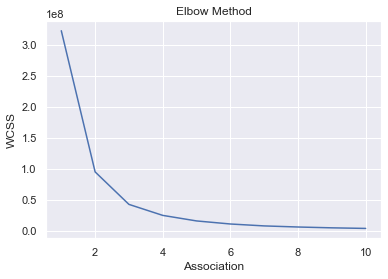

In [60]:
# select the optimal number of clusters: 3
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',
                    max_iter = 400, n_init = 10, random_state = SEED)
    kmeans.fit(segment[['recency']])
    wcss.append(kmeans.inertia_)
    
# plot a line graph to observe 'The elbow'
sns.set()
sns.lineplot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Association')
plt.ylabel('WCSS')
plt.show()

In [87]:
# cluster by recency
kmeans = KMeans(n_clusters = 3, random_state = SEED)
kmeans.fit(segment[['recency']])
segment['recency_cluster'] = kmeans.predict(segment[['recency']])
reordered_recency = order_cluster('recency', 'recency_cluster', False)
segment['recency_rank'] = segment.recency_cluster.map(reordered_recency)

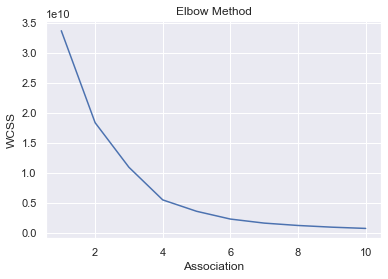

In [80]:
# select the optimal number of clusters: 4
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',
                    max_iter = 400, n_init = 10, random_state = SEED)
    kmeans.fit(segment[['revenue']])
    wcss.append(kmeans.inertia_)
    
# plot a line graph to observe 'The elbow'
sns.lineplot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Association')
plt.ylabel('WCSS')
plt.show()

In [81]:
# cluster by revenue
kmeans = KMeans(n_clusters = 4, random_state = SEED)
kmeans.fit(segment[['revenue']])
segment['revenue_cluster'] = kmeans.predict(segment[['revenue']])
reordered_revenue = order_cluster('revenue', 'revenue_cluster', True)
segment['revenue_rank'] = segment.revenue_cluster.map(reordered_revenue)

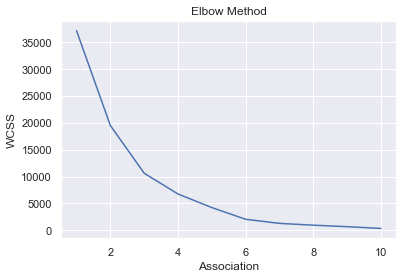

In [82]:
# select the optimal number of clusters: 5
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',
                    max_iter = 400, n_init = 10, random_state = SEED)
    kmeans.fit(segment[['frequency']])
    wcss.append(kmeans.inertia_)
    
# plot a line graph to observe 'The elbow'
sns.lineplot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Association')
plt.ylabel('WCSS')
plt.show()

In [83]:
# cluster by frequency
kmeans = KMeans(n_clusters = 5, random_state = SEED)
kmeans.fit(segment[['frequency']])
segment['frequency_cluster'] = kmeans.predict(segment[['frequency']])
reordered_frequency = order_cluster('frequency', 'frequency_cluster', True)
segment['frequency_rank'] = segment.frequency_cluster.map(reordered_frequency)

In [88]:
# customer value
segment['customer_value'] = segment.recency_rank + segment.revenue_rank + segment.frequency_rank
segment.groupby('customer_value')['recency', 'revenue', 'frequency'].agg(['count', 'mean'])

recency             revenue               frequency           
                 count        mean   count          mean     count       mean
customer_value                                                               
0                 2840  455.042606    2840    342.495683      2840   2.144014
1                 5007  270.571400    5007    413.412471      5007   2.339924
2                 5346  113.021886    5346    474.320262      5346   2.491395
3                  695  121.709353     695   1504.171842       695   4.955396
4                  160  123.212500     160   3850.631875       160   8.300000
5                   37  140.243243      37   9728.556757        37  11.594595
6                    8  208.000000       8  34581.157500         8  14.500000
7                    1   20.000000       1  27935.460000         1  24.000000

In [89]:
# create the value rank: 0-2 -> low, 3-4 -> medium, 5-7 -> high
segment['value_rank'] = segment.customer_value.apply(lambda x: 0 if x in range(3) else (1 if x in range(3, 5) else 2))

In [90]:
# visualize the customer segments
fig = px.scatter_3d(segment, x='recency', y='revenue', z='frequency', color='value_rank', opacity=0.5, size_max=5)
fig.show()

In [91]:
segment

,customer_unique_id,recency,revenue,frequency,recency_cluster,recency_rank,revenue_cluster,revenue_rank,frequency_cluster,frequency_rank,customer_value,value_rank
0,9eae34bbd3a474ec5d07949ca7de67c0,293,551.58,2,2,1,0,0,0,0,1,0
1,31318a0597cd9d50ce4cfd03c80fe780,215,515.00,2,2,1,0,0,0,0,1,0
2,83aca63b2193ea126b287f3ae61528d9,477,5061.96,6,1,0,3,1,1,1,2,0
3,9e8993ba2665307b71bd1641c2e1cb3d,565,540.00,2,1,0,0,0,0,0,0,0
4,7dd466ce70871be5aba0ea1a43df6021,154,154.96,2,0,2,0,0,0,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...
14089,74ec77145a467b1a96152aac1c3ab137,35,244.00,2,0,2,0,0,0,0,2,0
14090,514f2a78d07928478ac9212b21b7acbc,412,21.81,4,1,0,0,0,1,1,1,0
14091,6d443b75cff956bb73dce7385033e266,358,882.10,12,1,0,0,0,4,2,2,0
14092,40eeaec8ded23f98865c1ebdb041f6ea,202,204.40,2,2,1,0,0,0,0,1,0


In [102]:
lowv_id = segment.loc[segment.value_rank==0, 'customer_unique_id']
mediumv_id = segment.loc[segment.value_rank==1, 'customer_unique_id']
highv_id = segment.loc[segment.value_rank==2, 'customer_unique_id']

lowv = customer_profile[customer_profile.customer_unique_id.isin(lowv_id)].set_index('customer_unique_id')
mediumv = customer_profile[customer_profile.customer_unique_id.isin(mediumv_id)].set_index('customer_unique_id')
highv = customer_profile[customer_profile.customer_unique_id.isin(highv_id)].set_index('customer_unique_id')

## Modeling

### Low Value Customer

In [103]:
# train test split
X = lowv.drop('churn', axis=1)
y = lowv.churn

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=SEED)

In [107]:
# use logistic regression as the baseline model
model = LogisticRegression(random_state=SEED)
model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_pred = model.predict(X_test)

train_accuracy = accuracy_score(y_train, y_train_pred)
train_recall = recall_score(y_train, y_train_pred)
train_precision = precision_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)

test_accuracy = accuracy_score(y_test, y_pred)
test_recall = recall_score(y_test, y_pred)
test_precision = precision_score(y_test, y_pred)
test_f1 = f1_score(y_test, y_pred)

print('Baseline train accuracy score: ' + str(round(train_accuracy, 4)))
print('Baseline train precision score: ' + str(round(train_precision, 4)))
print('Baseline train recall score: ' + str(round(train_recall, 4)))
print('Baseline train f1 score: ' + str(round(train_f1, 4)))
print('Baseline test accuracy score: ' + str(round(test_accuracy, 4)))
print('Baseline test precision score: ' + str(round(test_precision, 4)))
print('Baseline test recall score: ' + str(round(test_recall, 4)))
print('Baseline test f1 score: ' + str(round(test_f1, 4)))

Baseline train accuracy score: 0.9342
Baseline train precision score: 0.8787
Baseline train recall score: 0.8165
Baseline train f1 score: 0.8465
Baseline test accuracy score: 0.9341
Baseline test precision score: 0.8745
Baseline test recall score: 0.8208
Baseline test f1 score: 0.8468


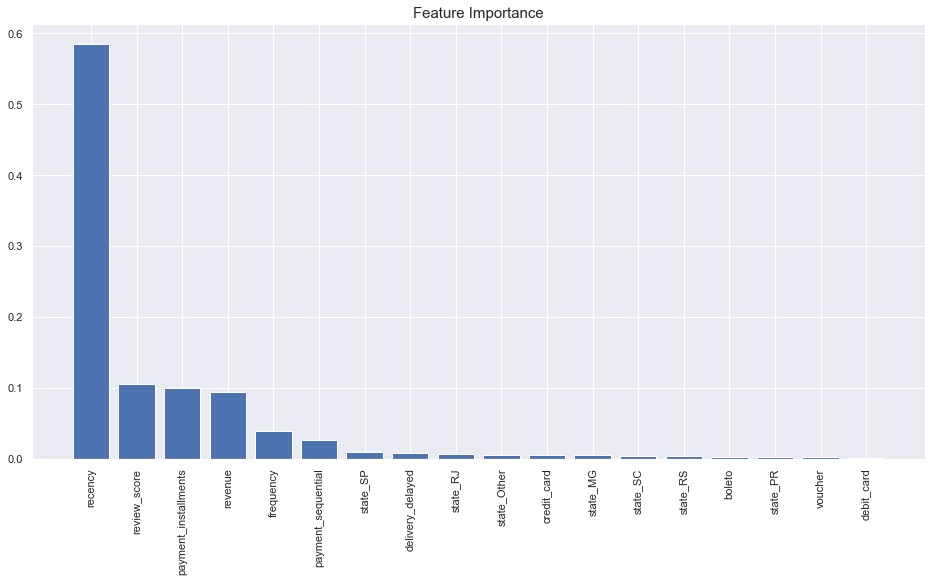

In [110]:
# feature importance

# define which resampling method and which ML model to use in the pipeline
scaler = StandardScaler()
resampling = ADASYN(random_state=SEED, sampling_strategy=1.0)
model = RandomForestClassifier(random_state=SEED)

# define the pipeline, tell it to combine ADASYN with the Logistic Regression model
pipeline = Pipeline([('Scaler', scaler), ('ADASYN', resampling), ('Classifier', model)])

# fit the data and get the train score
pipeline = pipeline.fit(X_train, y_train)

# features and feature importances
sns.set()
fig = plt.figure(figsize=(16, 8))

features = X_train.columns
importances = pipeline.steps[2][1].feature_importances_
indices = np.argsort(importances)[::-1]
names = [features[i] for i in indices]

plt.title('Feature Importance', fontsize=15)
plt.bar(range(X_train.shape[1]), importances[indices])
plt.xticks(range(X_train.shape[1]), names, rotation=90)

plt.show()

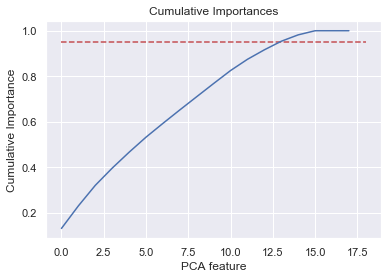

In [113]:
# perform PCA to reduce the dimension for clustering
# choose the optimal dimensions
scaler = StandardScaler()
pca = PCA()
pipeline = Pipeline([('Scaler', scaler), ('PCA', pca)])
pipeline.fit(X_train)

# Plot the explained variances ratio
features = range(pca.n_components_)
plt.plot(features, pca.explained_variance_ratio_.cumsum())
plt.hlines(y=0.95, xmin=0 , xmax=len(features), color='r', linestyles='dashed')
plt.xlabel('PCA feature')
plt.ylabel('Cumulative Importance')
plt.title('Cumulative Importances')
plt.show()

In [117]:
# find number of features for cumulative importance of 95%
print('Number of features for 85% importance:', np.where(pca.explained_variance_ratio_.cumsum() > 0.95)[0][0])

Number of features for 85% importance: 13


In [128]:
def build_model(input_model, param_dist):

    # define which resampling method and which ML model to use in the pipeline
    scaler = StandardScaler()
    pca = PCA(n_components=13)
    resampling = ADASYN(random_state=SEED, sampling_strategy=1.0)
    model = input_model

    # define the pipeline, tell it to combine ADASYN with the Logistic Regression model
    pipeline = Pipeline([('Scaler', scaler), ('PCA', pca), ('ADASYN', resampling), ('Classifier', model)])
    
    # stratified k fold
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=SEED)

    # tune hyperparameter
    pipeline = RandomizedSearchCV(pipeline, param_distributions=param_dist, scoring='f1', cv=kfold, n_iter=10, n_jobs=-1, random_state=SEED)

    # fit the data
    pipeline.fit(X_train, y_train)
    pipeline = pipeline.best_estimator_

    # track progress
    print('Done!')
    
    return pipeline

In [129]:
# define param_dist
logreg_param = {'Classifier__C' : np.logspace(-4, 4, 20)}
knn_param = {'Classifier__n_neighbors': range(5, 10)}
svc_param = {'Classifier__C' : np.logspace(-4, 4, 20),
             'Classifier__gamma': np.logspace(-4, 4, 20)}
dt_param = {'Classifier__max_depth': range(3, 5),
            'Classifier__max_features': range(1, 12),
            'Classifier__min_samples_leaf': range(5, 10),
            'Classifier__criterion': ["gini", "entropy"]}
rf_param = {'Classifier__n_estimators': range(400, 1000, 10),
            'Classifier__max_features': ['auto', 'sqrt'],
            'Classifier__max_depth': range(3, 7),
            'Classifier__min_samples_split': range(2, 8),
            'Classifier__min_samples_leaf': range(3, 10)}
lgbm_param = {'Classifier__n_estimators': range(20, 200, 10),
              'Classifier__learning_rate': [0.0001, 0.001, 0.01, 1, 2, 5],
              'Classifier__max_depth': range(3, 5), 
              'Classifier__min_samples_split': range(2, 10),
              'Classifier__min_samples_leaf':range(5, 10),
              'Classifier__max_features': range(3, 12),
              'Classifier__subsample': [0.6, 0.7, 0.75, 0.8]}

In [130]:
logreg1 = build_model(LogisticRegression(random_state=SEED), logreg_param)
knn1 = build_model(KNeighborsClassifier(), knn_param)
svc1 = build_model(SVC(random_state=SEED), svc_param)
dt1 = build_model(DecisionTreeClassifier(random_state=SEED), dt_param)
rf1 = build_model(RandomForestClassifier(random_state=SEED), rf_param)
lgbm1 = build_model(LGBMClassifier(random_state=SEED), lgbm_param)

Done!
Done!
Done!
Done!
Done!
Done!


In [136]:
train_score = []
cv_score = []
test_accuracy = []
test_precision = []
test_recall = []
test_f1 = []

In [137]:
def score(model):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    train_f1 = f1_score(y_train, y_train_pred)
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=SEED)
    cv_f1 = np.mean(cross_val_score(model, X_train, y_train, cv=kfold, scoring='f1', n_jobs=-1))
    t_accuracy = accuracy_score(y_test, y_test_pred)
    t_precision = precision_score(y_test, y_test_pred)
    t_recall = recall_score(y_test, y_test_pred)
    t_f1 = f1_score(y_test, y_test_pred)
    
    train_score.append(train_f1)
    cv_score.append(cv_f1)
    test_accuracy.append(t_accuracy)
    test_precision.append(t_precision)
    test_recall.append(t_recall)
    test_f1.append(t_f1)

In [138]:
score(logreg1)
score(knn1)
score(svc1)
score(dt1)
score(rf1)
score(lgbm1)

In [141]:
# take a look at the scores and go back to tune the hyperparameters if see any indication of overfitting or underfitting
classifiers = ['Logistic Regression', 'KNN', 'SVM', 'Decision Tree', 'Random Forest', 'Light GBM']
result = pd.DataFrame({'Train F1': train_score, 'CV F1': cv_score, 'Test Accuracy': test_accuracy,
                        'Test Precision': test_precision, 'Test Recall': test_recall, 'Test F1': test_f1}, 
                        index=classifiers)
result = result.sort_values(by='Test F1', ascending=False)
result

,Train F1,CV F1,Test Accuracy,Test Precision,Test Recall,Test F1
Light GBM,0.787785,0.775546,0.896552,0.721986,0.868601,0.788536
Random Forest,0.797630,0.779070,0.894278,0.711142,0.882253,0.787510
SVM,0.811787,0.786748,0.889731,0.697456,0.889078,0.781695
Decision Tree,0.773681,0.742623,0.888973,0.722983,0.810580,0.764280
KNN,0.857617,0.743547,0.877226,0.670130,0.880546,0.761062
Logistic Regression,0.667395,0.674649,0.815081,0.550205,0.916382,0.687580


<Figure size 432x288 with 0 Axes>

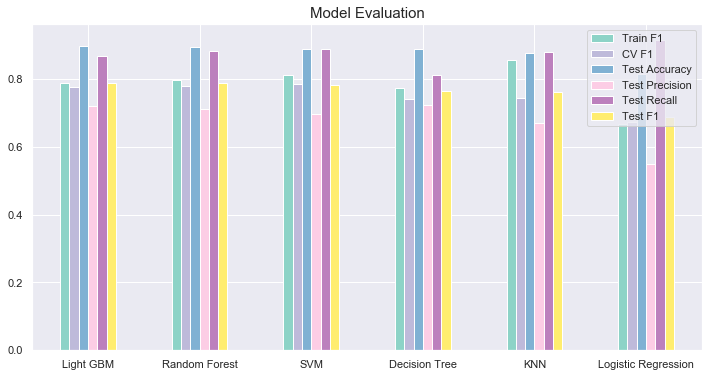

In [140]:
# visualize the metrics
fig = plt.figure()

result.plot.bar(rot=0, colormap = 'Set3', figsize=(12,6))
plt.title('Model Evaluation', fontsize = 15)

plt.show()